In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def showit(Title="",image=None,size=10):
  w,h=image.shape[0],image.shape[1]
  aspect_ratio=w/h
  plt.figure(figsize=(aspect_ratio*size,size))
  plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
  plt.title(Title)
  plt.show()

In [5]:
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!unzip -qq images.zip

--2023-04-14 17:47:30--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.148.186
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.148.186|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  17.5MB/s    in 1.6s    

2023-04-14 17:47:32 (17.5 MB/s) - ‘images.zip’ saved [29586716/29586716]



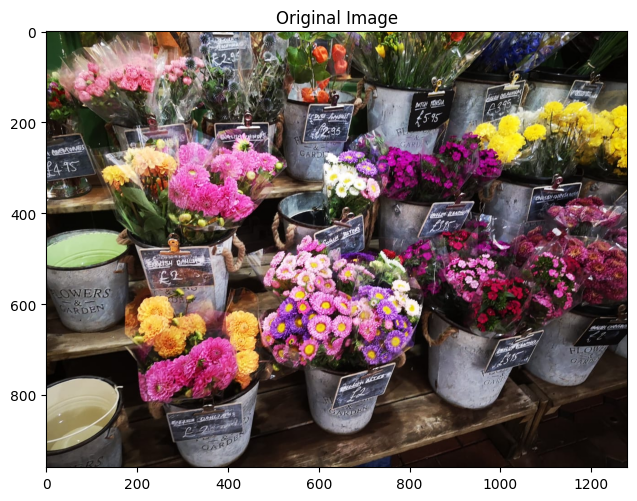

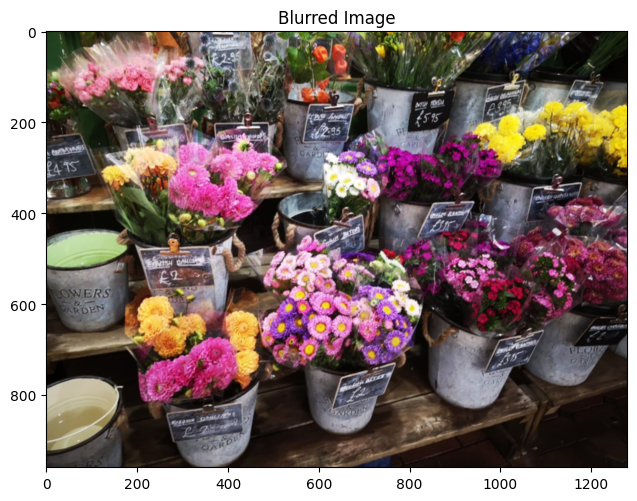

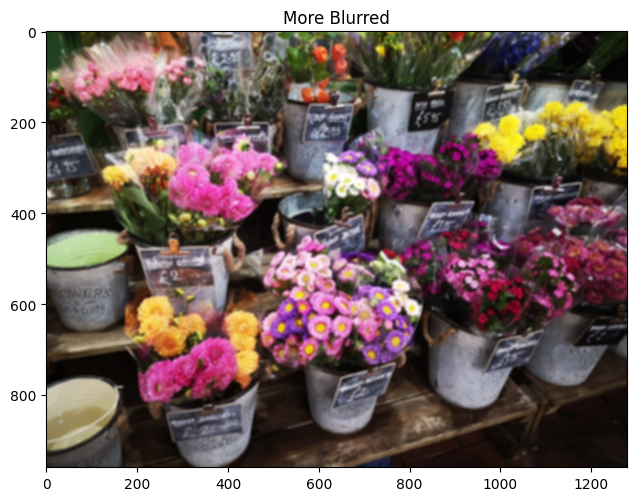

In [8]:
image = cv2.imread('images/flowers.jpeg')
showit("Original Image",image)
kernel_3x3=np.ones((3,3),np.float32)/9
blurred=cv2.filter2D(image,-1,kernel_3x3)
showit("Blurred Image",blurred)
kernel_7x7=np.ones((7,7),np.float32)/49
moreblur=cv2.filter2D(image,-1,kernel_7x7)
showit("More Blurred",moreblur)

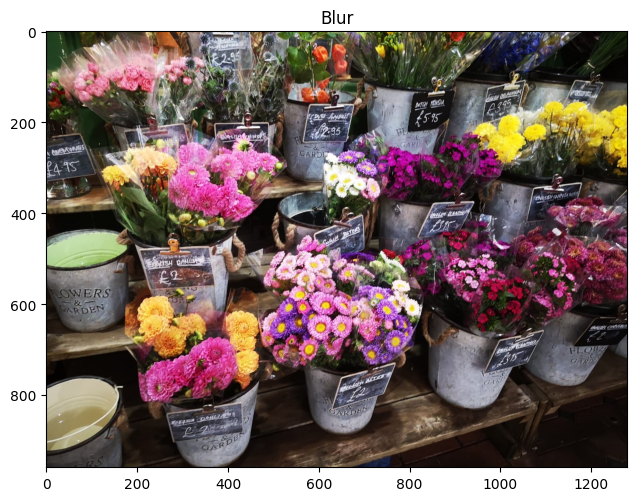

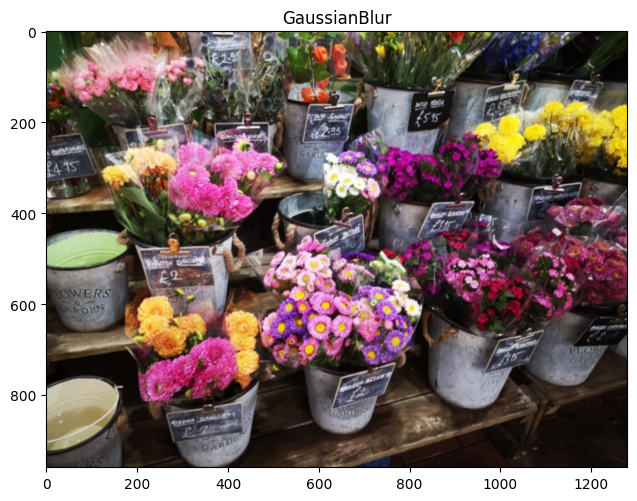

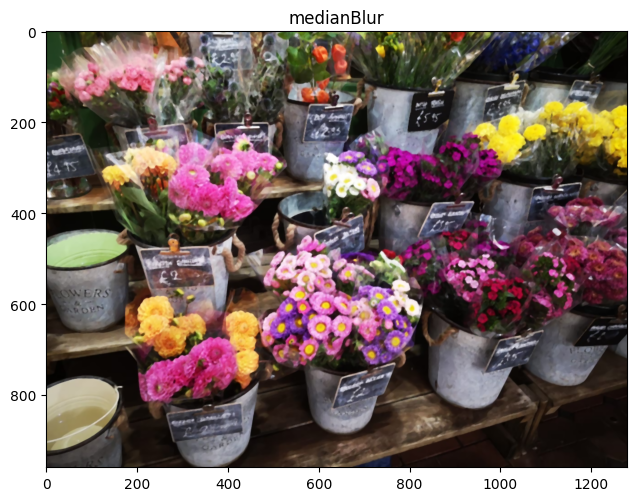

In [9]:
image=cv2.imread('images/flowers.jpeg')
blur=cv2.blur(image,(5,5)) #box size need to be odd and positive
gaussian_blur=cv2.GaussianBlur(image,(5,5),0)
median_blur=cv2.medianBlur(image,5)
showit("Blur",image)
showit("GaussianBlur",gaussian_blur)
showit("medianBlur",median_blur)

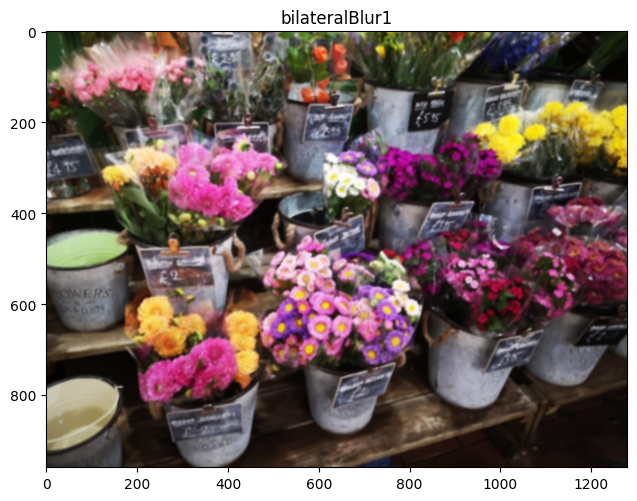

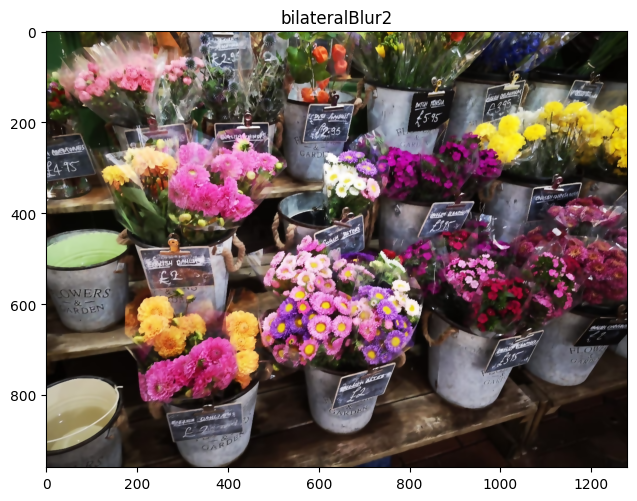

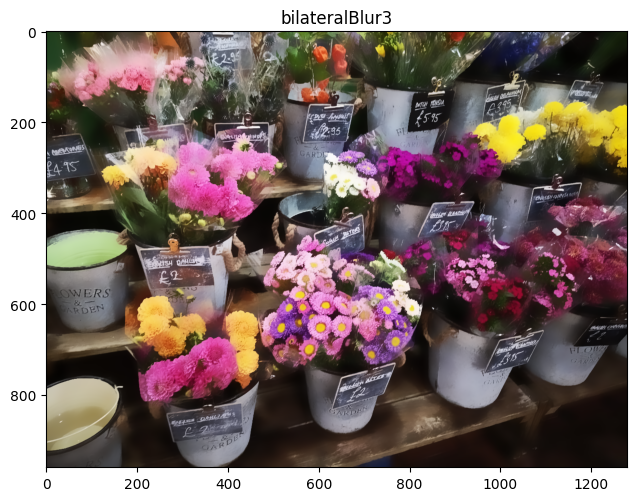

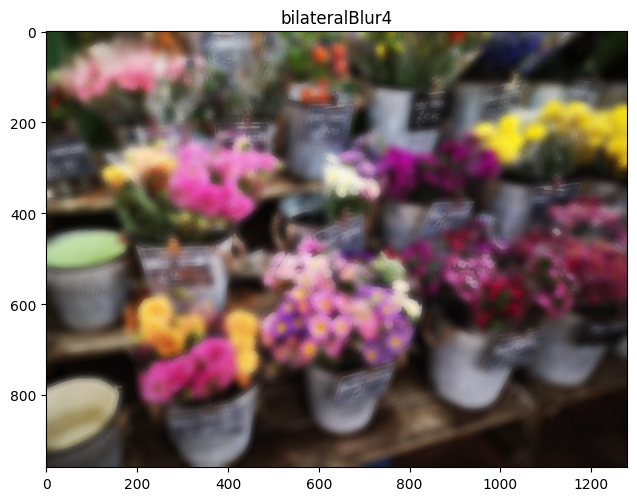

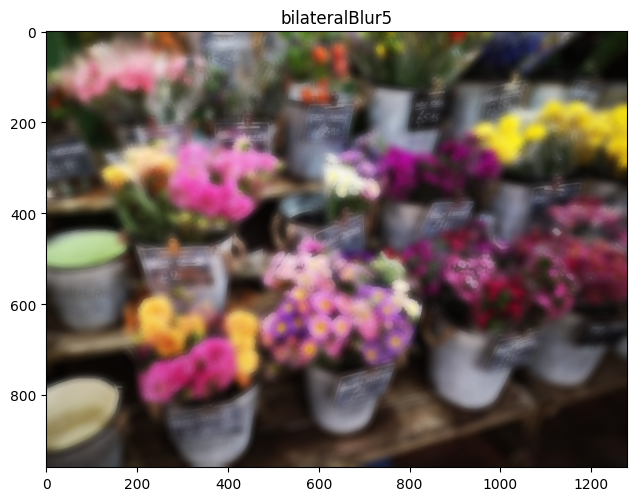

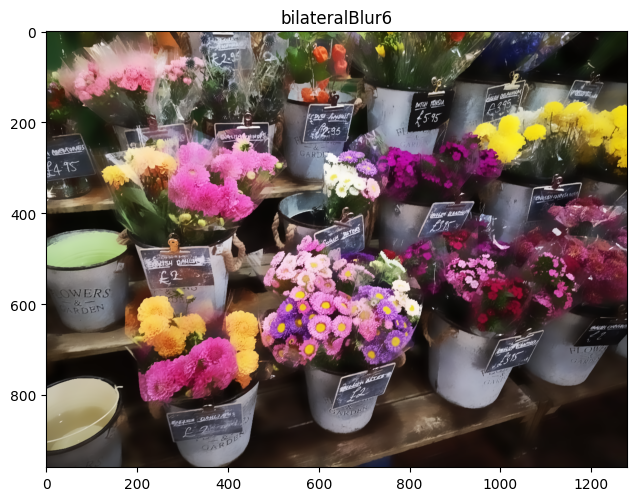

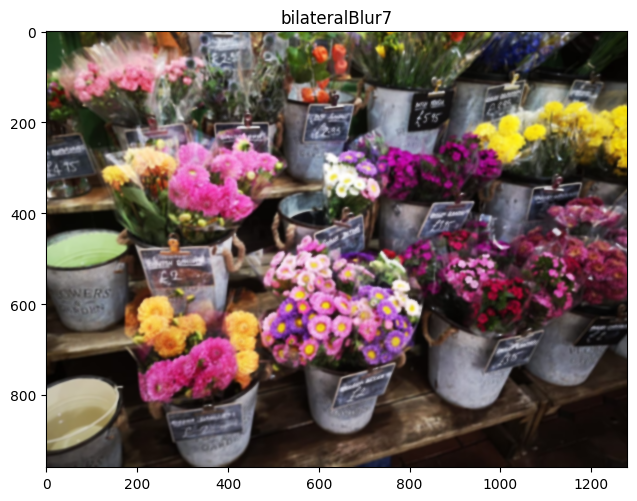

In [18]:
bilateralFilter1=cv2.bilateralFilter(image,9,475,475)
bilateralFilter2=cv2.bilateralFilter(image,9,75,75)
bilateralFilter3=cv2.bilateralFilter(image,29,75,75)
bilateralFilter4=cv2.bilateralFilter(image,29,475,475)
bilateralFilter5=cv2.bilateralFilter(image,29,475,75)
bilateralFilter6=cv2.bilateralFilter(image,29,75,475)
bilateralFilter7=cv2.bilateralFilter(image,9,475,75)
showit("bilateralBlur1",bilateralFilter1)
showit("bilateralBlur2",bilateralFilter2)
showit("bilateralBlur3",bilateralFilter3)
showit("bilateralBlur4",bilateralFilter4)
showit("bilateralBlur5",bilateralFilter5)
showit("bilateralBlur6",bilateralFilter6)
showit("bilateralBlur7",bilateralFilter7)

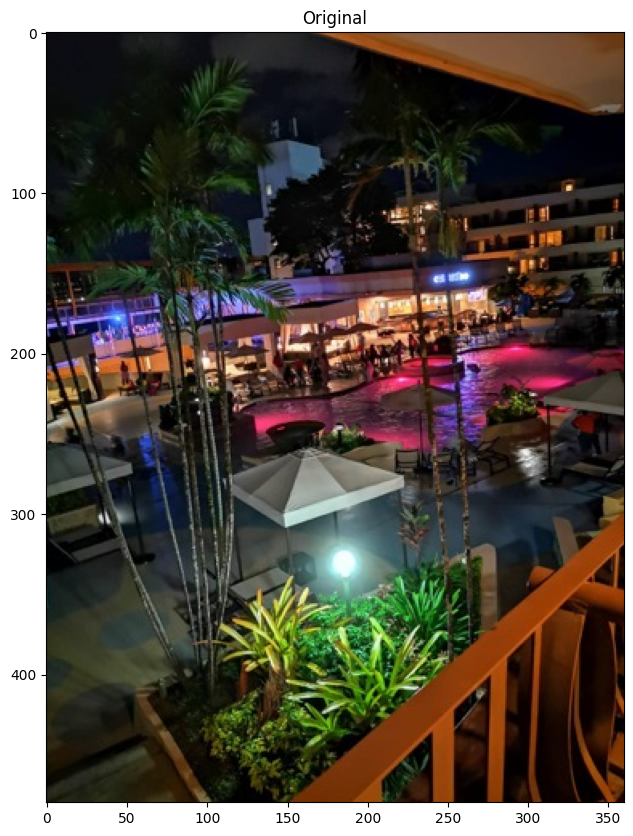

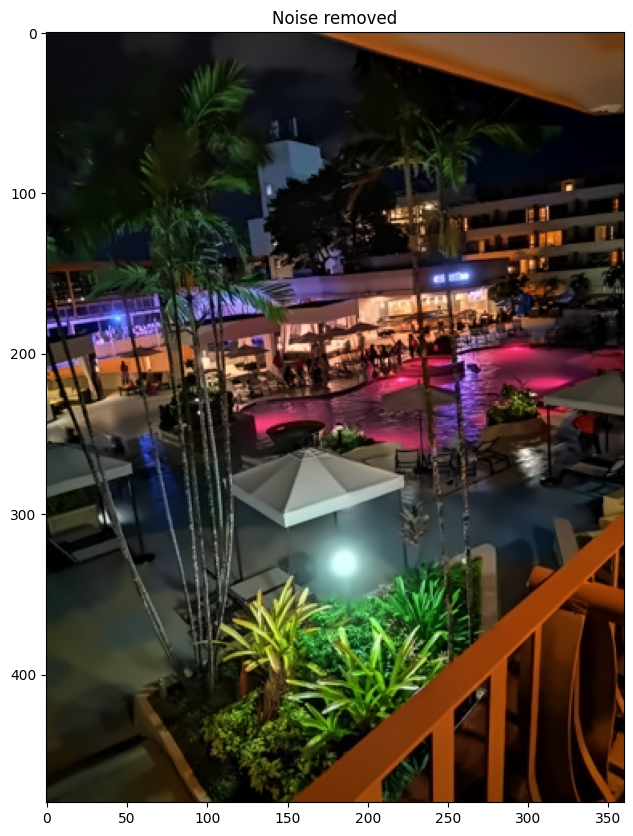

In [21]:
#fastNlMeansDenoisingColored(InputArray src, OutputArray dst, float h=3, float hColor=3, int templateWindowSize=7, int searchWindowSize=21 )
image = cv2.imread('images/hilton.jpeg')
showit('Original', image)

noiserem=cv2.fastNlMeansDenoisingColored(image,None,6,6,7,21)
showit('Noise removed',noiserem)

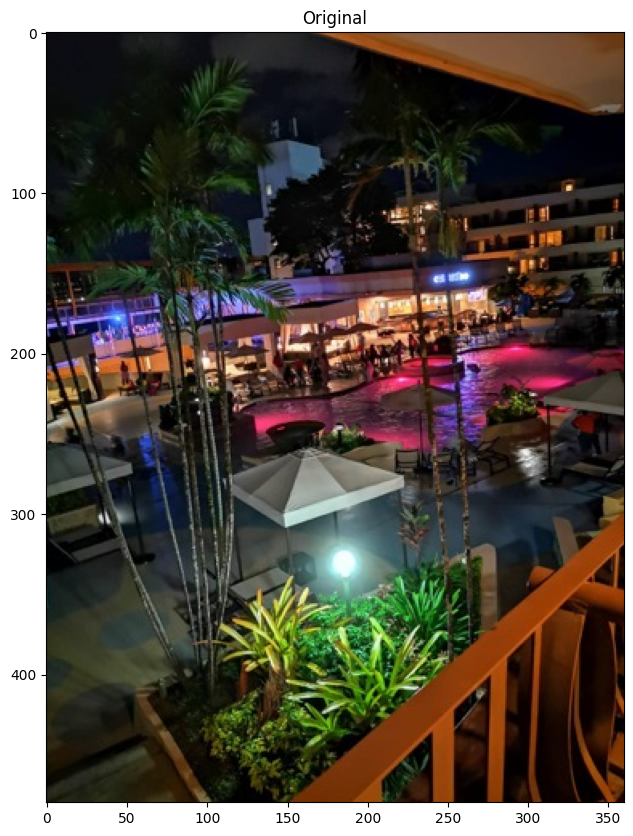

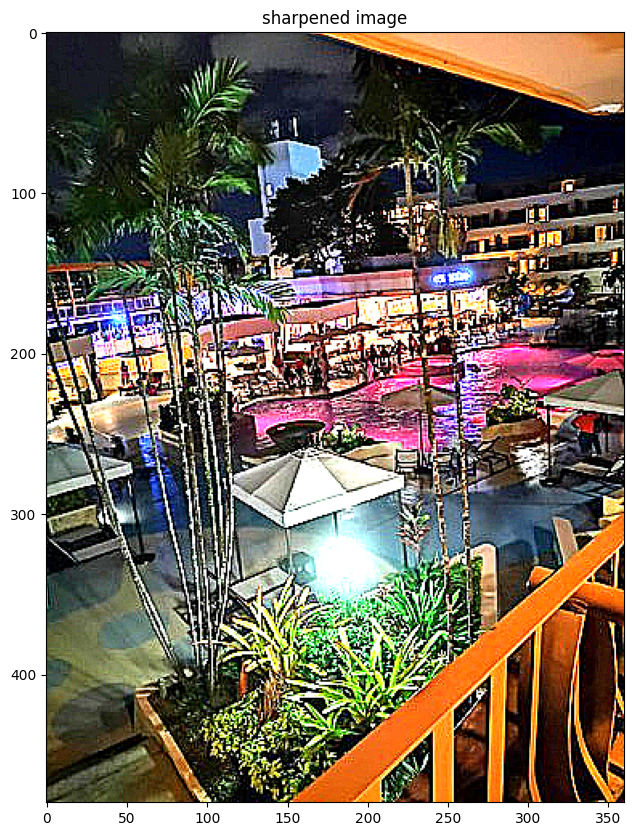

In [25]:
image = cv2.imread('images/hilton.jpeg')
showit('Original', image)

kernel_sharpening = np.array([[-1,-1,-1], 
                              [-1, 10,-1],
                              [-1,-1,-1]]) #sum must be zero
sharpened=cv2.filter2D(image,-1,kernel_sharpening)
showit('sharpened image',sharpened)